#Green Detection YOLO
Our third attempt at performing object detection with the YOLO-NAS algorithm was with the "GreenDetection Dataset". However, this Dataset only contained a limited amount of medium-to-low resolution aerial images of trees, taken mostly in urban scenarios.

Believing this dataset was too deficient, we integrated it with the "Palm-Tree Dataset", containing high resolution aerial shots of trees (mostly palms). Training the model on the extended dataset, we noticed a great jump in accuracy.


Hence, thiis Notebook has the purpose of performing object detection on **two classes of objects**:

1.   Tree
2.   Palm

This dataset -with some limitations- has some potentiality. Object detection of this kind could be useful in enviromental studies, such as air quality prediction.

Moreover, we proved that integration of different datasets, if done with enough thought, can be extremely beneficial. A further extension, both in number of samples and possibly in number of classes is a valuable option, considering the training set is still reasonably small.



## Preliminary Imports and Google Drive Mounting

###SuperGradiants Installation
The YOLO-NAS algorithm was developed by SuperGradients. Therefore, we need to install super-gradients.

**NOTE:**

Due to some conflictual dependencies, executing this code in Google Colab might require to reboot the session before going on with the rest of the code.
Once this cell is executed, follow the instruction on the screen, reboot the session as indicated, then proceed executing the rest of the code. Ignore the error at the end of the execution of the cell, since it's factually irrelevant

In [ ]:
# One time installation.
!pip install super-gradients

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 31.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.3/139.3 kB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 684.5/684.5 kB 16.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 54.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 46.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 408.6/408.6 kB 21.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 16.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 5.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.9/5.9 MB 38.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.7/15.7 MB 13.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 18.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.p

###Google Drive Mounting
In order to easily manipulate Datasets and models, it's useful to mount Google Drive on the current directory.

**NOTE:**

The path to the folder "Project_Intelligent" containing all projects' files might be different from the one reported here. Either modify the path or select the Folder on Google Drive create a shortcut to "MyDrive".

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Unzip Dataset into the current directory
file_zip = '/content/drive/MyDrive/Project_Intelligent/Datasets/GreenDetection.zip'
final_directory = '/content/'
with zipfile.ZipFile(file_zip, 'r') as zip_ref:
    zip_ref.extractall(final_directory)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


###Import of useful libraries

In [ ]:
#Installation of libreries
from super_gradients.training import Trainer
from super_gradients.training import dataloaders
from super_gradients.training.dataloaders.dataloaders import (
    coco_detection_yolo_format_train,
    coco_detection_yolo_format_val
)
from super_gradients.training import models
from super_gradients.training.losses import PPYoloELoss
from super_gradients.training.metrics import (
    DetectionMetrics_050,
    DetectionMetrics_050_095
)
from super_gradients.training.models.detection_models.pp_yolo_e import PPYoloEPostPredictionCallback
from tqdm.auto import tqdm

import os
import requests
import zipfile
import cv2
import matplotlib.pyplot as plt
import glob
import numpy as np
import random
import torch

The console stream is logged into /root/sg_logs/console.log


[2024-05-11 15:55:25] INFO - crash_tips_setup.py - Crash tips is enabled. You can set your environment variable to CRASH_HANDLER=FALSE to disable it
[2024-05-11 15:55:40] INFO - utils.py - NumExpr defaulting to 2 threads.


## Creating and Training Model
The following code section shall be executed only if you want to train your own model. Otherwise, it can be skipped and a pre-trained model can be imported from the "Import" section.

### Define Dataset Directories

In [ ]:
# Define Paths to useful folders
ROOT_DIR = 'GreenDetection/GreenDetection'
train_imgs_dir = 'train/images'
train_labels_dir = 'train/labels'
val_imgs_dir = 'valid/images'
val_labels_dir = 'valid/labels'
test_imgs_dir = 'test/images'

# Define Dataset Classification Classes
classes = ['Tree','Palm']

In [ ]:
# Define dataset parameters
dataset_params = {
    'data_dir':ROOT_DIR,
    'train_images_dir':train_imgs_dir,
    'train_labels_dir':train_labels_dir,
    'val_images_dir':val_imgs_dir,
    'val_labels_dir':val_labels_dir,
    'test_images_dir':test_imgs_dir,
    'classes':classes
}

### Plot some Training Images
The following code section's execution can be skipped if not interested in visualizing training images

In [ ]:
colors = np.random.uniform(0, 255, size=(len(classes), 3))

In [ ]:
# Function to convert bounding boxes in YOLO format to xmin, ymin, xmax, ymax.
def yolo2bbox(bboxes):
    xmin, ymin = bboxes[0]-bboxes[2]/2, bboxes[1]-bboxes[3]/2
    xmax, ymax = bboxes[0]+bboxes[2]/2, bboxes[1]+bboxes[3]/2
    return xmin, ymin, xmax, ymax

In [ ]:
def plot_box(image, bboxes, labels):
    # Need the image height and width to denormalize
    # the bounding box coordinates
    height, width, _ = image.shape
    lw = max(round(sum(image.shape) / 2 * 0.003), 2)  # Line width.
    tf = max(lw - 1, 1) # Font thickness.
    for box_num, box in enumerate(bboxes):
        x1, y1, x2, y2 = yolo2bbox(box)
        # denormalize the coordinates
        xmin = int(x1*width)
        ymin = int(y1*height)
        xmax = int(x2*width)
        ymax = int(y2*height)

        p1, p2 = (int(xmin), int(ymin)), (int(xmax), int(ymax))

        class_name = classes[int(labels[box_num])]

        color=colors[classes.index(class_name)]

        cv2.rectangle(
            image,
            p1, p2,
            color=color,
            thickness=lw,
            lineType=cv2.LINE_AA
        )

        # For filled rectangle.
        w, h = cv2.getTextSize(
            class_name,
            0,
            fontScale=lw / 3,
            thickness=tf
        )[0]

        outside = p1[1] - h >= 3
        p2 = p1[0] + w, p1[1] - h - 3 if outside else p1[1] + h + 3

        cv2.rectangle(
            image,
            p1, p2,
            color=color,
            thickness=-1,
            lineType=cv2.LINE_AA
        )
        cv2.putText(
            image,
            class_name,
            (p1[0], p1[1] - 5 if outside else p1[1] + h + 2),
            cv2.FONT_HERSHEY_SIMPLEX,
            fontScale=lw/3.5,
            color=(255, 255, 255),
            thickness=tf,
            lineType=cv2.LINE_AA
        )
    return image

In [ ]:
# Function to plot images with the bounding boxes.
def plot(image_path, label_path, num_samples):
    all_training_images = glob.glob(image_path+'/*')
    all_training_labels = glob.glob(label_path+'/*')
    all_training_images.sort()
    all_training_labels.sort()

    temp = list(zip(all_training_images, all_training_labels))
    random.shuffle(temp)
    all_training_images, all_training_labels = zip(*temp)
    all_training_images, all_training_labels = list(all_training_images), list(all_training_labels)

    num_images = len(all_training_images)

    if num_samples == -1:
        num_samples = num_images

    plt.figure(figsize=(15, 12))
    for i in range(num_samples):
        image_name = all_training_images[i].split(os.path.sep)[-1]
        print(image_name)
        image = cv2.imread(all_training_images[i])
        with open(all_training_labels[i], 'r') as f:
            bboxes = []
            labels = []
            label_lines = f.readlines()
            for label_line in label_lines:
                label, x_c, y_c, w, h = label_line.split(' ')
                x_c = float(x_c)
                y_c = float(y_c)
                w = float(w)
                h = float(h)
                bboxes.append([x_c, y_c, w, h])
                labels.append(label)
        result_image = plot_box(image, bboxes, labels)
        plt.subplot(2, 2, i+1) # Visualize 2x2 grid of images.
        plt.imshow(image[:, :, ::-1])
        plt.axis('off')
    plt.tight_layout()
    plt.show()

In [ ]:
# Visualize a few training images.
plot(
    image_path=os.path.join(ROOT_DIR, train_imgs_dir),
    label_path=os.path.join(ROOT_DIR, train_labels_dir),
    num_samples=4,
)

Output hidden; open in https://colab.research.google.com to view.

###Model Training
The YOLO-NAS model chosen for this task is the "medium model" (about 51.13M parameters).

The hyperparameters are chosen in order to optimize model precision, but most importantly to allow execution on Google Colab without a payed subscription.
Weights are initialized as COCO dataset weights.

In [ ]:
# Define training hyperparameters
EPOCHS = 10
BATCH_SIZE = 16
WORKERS = 8

In [ ]:
# Training data extraction
train_data = coco_detection_yolo_format_train(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['train_images_dir'],
        'labels_dir': dataset_params['train_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size':BATCH_SIZE,
        'num_workers':WORKERS
    }
)

# Validation data extraction
val_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['val_images_dir'],
        'labels_dir': dataset_params['val_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size':BATCH_SIZE,
        'num_workers':WORKERS
    }
)

[2024-05-11 15:58:18] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 480/480 [00:00<00:00, 3546.76it/s]
/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
[2024-05-11 15:58:18] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.


In [ ]:
# Training Parameters for Yolo-NAS object
train_params = {
    'silent_mode': False,
    "average_best_models":True,
    "warmup_mode": "linear_epoch_step",
    "warmup_initial_lr": 1e-6,
    "lr_warmup_epochs": 3,
    "initial_lr": 5e-4,
    "lr_mode": "cosine",
    "cosine_final_lr_ratio": 0.1,
    "optimizer": "Adam",
    "optimizer_params": {"weight_decay": 0.0001},
    "zero_weight_decay_on_bias_and_bn": True,
    "ema": True,
    "ema_params": {"decay": 0.9, "decay_type": "threshold"},
    "max_epochs": EPOCHS,
    "mixed_precision": True,
    "loss": PPYoloELoss(
        use_static_assigner=False,
        num_classes=len(dataset_params['classes']),
        reg_max=16
    ),
    "valid_metrics_list": [
        DetectionMetrics_050(
            score_thres=0.1,
            top_k_predictions=300,
            num_cls=len(dataset_params['classes']),
            normalize_targets=True,
            post_prediction_callback=PPYoloEPostPredictionCallback(
                score_threshold=0.01,
                nms_top_k=1000,
                max_predictions=300,
                nms_threshold=0.7
            )
        ),
        DetectionMetrics_050_095(
            score_thres=0.1,
            top_k_predictions=300,
            num_cls=len(dataset_params['classes']),
            normalize_targets=True,
            post_prediction_callback=PPYoloEPostPredictionCallback(
                score_threshold=0.01,
                nms_top_k=1000,
                max_predictions=300,
                nms_threshold=0.7
            )
        )
    ],
    "metric_to_watch": 'mAP@0.50:0.95'
}

In [ ]:
# Model selection (S, M, L). Uncomment the chosen one
models_to_train = [
    #'yolo_nas_s',
    'yolo_nas_m',
    #'yolo_nas_l'
]

During training, SuperGradients saves checkpoints (such as the Best model so far) so that training can be resumed or weights con be restored as for some saved checkpoint.

In [ ]:
# Define checkpoint directory
CHECKPOINT_DIR = 'checkpoints'

In [ ]:
# Model training
for model_to_train in models_to_train:
    trainer = Trainer(
        experiment_name=model_to_train,
        ckpt_root_dir=CHECKPOINT_DIR
    )

    model = models.get(
        model_to_train,
        num_classes=len(dataset_params['classes']),
        pretrained_weights="coco"
    )

    trainer.train(
        model=model,
        training_params=train_params,
        train_loader=train_data,
        valid_loader=val_data
    )

[2024-05-10 15:25:45] WARNING - checkpoint_utils.py - :warning: The pre-trained models provided by SuperGradients may have their own licenses or terms and conditions derived from the dataset used for pre-training.
 It is your responsibility to determine whether you have permission to use the models for your use case.
 The model you have requested was pre-trained on the coco dataset, published under the following terms: https://cocodataset.org/#termsofuse
[2024-05-10 15:25:45] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
Downloading: "https://sghub.deci.ai/models/yolo_nas_m_coco.pth" to /root/.cache/torch/hub/checkpoints/yolo_nas_m_coco.pth
100%|██████████| 196M/196M [00:00<00:00, 266MB/s]
[2024-05-10 15:25:47] INFO - checkpoint

The console stream is now moved to checkpoints/yolo_nas_m/RUN_20240510_152547_548422/console_May10_15_25_47.txt


[2024-05-10 15:27:40] INFO - sg_trainer_utils.py - TRAINING PARAMETERS:
    - Mode:                         Single GPU
    - Number of GPUs:               1          (1 available on the machine)
    - Full dataset size:            480        (len(train_set))
    - Batch size per GPU:           16         (batch_size)
    - Batch Accumulate:             1          (batch_accumulate)
    - Total batch size:             16         (num_gpus * batch_size)
    - Effective Batch size:         16         (num_gpus * batch_size * batch_accumulate)
    - Iterations per epoch:         30         (len(train_loader))
    - Gradient updates per epoch:   30         (len(train_loader) / batch_accumulate)
    - Model: YoloNAS_M  (51.13M parameters, 51.13M optimized)
    - Learning Rates and Weight Decays:
      - default: (51.13M parameters). LR: 0.0005 (51.13M parameters) WD: 0.0, (72.21K parameters), WD: 0.0001, (51.06M parameters)

[2024-05-10 15:27:40] INFO - sg_trainer.py - Started training for 1

SUMMARY OF EPOCH 0
├── Train
│   ├── Ppyoloeloss/loss_cls = 2.2457
│   ├── Ppyoloeloss/loss_iou = 1.0142
│   ├── Ppyoloeloss/loss_dfl = 0.9123
│   └── Ppyoloeloss/loss = 4.1723
└── Validation
    ├── Ppyoloeloss/loss_cls = 2.5067
    ├── Ppyoloeloss/loss_iou = 0.871
    ├── Ppyoloeloss/loss_dfl = 0.8549
    ├── Ppyoloeloss/loss = 4.2327
    ├── Precision@0.50 = 0.0
    ├── Recall@0.50 = 0.0
    ├── Map@0.50 = 0.0003
    ├── F1@0.50 = 0.0
    ├── Best_score_threshold = 0.0
    ├── Precision@0.50:0.95 = 0.0
    ├── Recall@0.50:0.95 = 0.0
    ├── Map@0.50:0.95 = 0.0001
    └── F1@0.50:0.95 = 0.0



Validating epoch 1: 100%|██████████| 5/5 [00:13<00:00,  2.62s/it]
[2024-05-10 15:38:26] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/yolo_nas_m/RUN_20240510_152547_548422/ckpt_best.pth
[2024-05-10 15:38:26] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.21510569751262665


SUMMARY OF EPOCH 1
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.4227
│   │   ├── Epoch N-1      = 2.2457 (↘ -0.823)
│   │   └── Best until now = 2.2457 (↘ -0.823)
│   ├── Ppyoloeloss/loss_iou = 0.8079
│   │   ├── Epoch N-1      = 1.0142 (↘ -0.2064)
│   │   └── Best until now = 1.0142 (↘ -0.2064)
│   ├── Ppyoloeloss/loss_dfl = 0.6743
│   │   ├── Epoch N-1      = 0.9123 (↘ -0.238)
│   │   └── Best until now = 0.9123 (↘ -0.238)
│   └── Ppyoloeloss/loss = 2.9048
│       ├── Epoch N-1      = 4.1723 (↘ -1.2674)
│       └── Best until now = 4.1723 (↘ -1.2674)
└── Validation
    ├── Ppyoloeloss/loss_cls = 15.3596
    │   ├── Epoch N-1      = 2.5067 (↗ 12.8528)
    │   └── Best until now = 2.5067 (↗ 12.8528)
    ├── Ppyoloeloss/loss_iou = 0.6225
    │   ├── Epoch N-1      = 0.871  (↘ -0.2485)
    │   └── Best until now = 0.871  (↘ -0.2485)
    ├── Ppyoloeloss/loss_dfl = 0.5118
    │   ├── Epoch N-1      = 0.8549 (↘ -0.3431)
    │   └── Best until now = 0.8549 (↘ -0.3431)
    ├── Ppyoloeloss/loss 

Validating epoch 2: 100%|██████████| 5/5 [00:21<00:00,  4.39s/it]


SUMMARY OF EPOCH 2
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9072
│   │   ├── Epoch N-1      = 1.4227 (↘ -0.5154)
│   │   └── Best until now = 1.4227 (↘ -0.5154)
│   ├── Ppyoloeloss/loss_iou = 0.6512
│   │   ├── Epoch N-1      = 0.8079 (↘ -0.1567)
│   │   └── Best until now = 0.8079 (↘ -0.1567)
│   ├── Ppyoloeloss/loss_dfl = 0.5379
│   │   ├── Epoch N-1      = 0.6743 (↘ -0.1364)
│   │   └── Best until now = 0.6743 (↘ -0.1364)
│   └── Ppyoloeloss/loss = 2.0964
│       ├── Epoch N-1      = 2.9048 (↘ -0.8085)
│       └── Best until now = 2.9048 (↘ -0.8085)
└── Validation
    ├── Ppyoloeloss/loss_cls = 6.5134
    │   ├── Epoch N-1      = 15.3596 (↘ -8.8462)
    │   └── Best until now = 2.5067 (↗ 4.0067)
    ├── Ppyoloeloss/loss_iou = 0.5274
    │   ├── Epoch N-1      = 0.6225 (↘ -0.0951)
    │   └── Best until now = 0.6225 (↘ -0.0951)
    ├── Ppyoloeloss/loss_dfl = 0.5022
    │   ├── Epoch N-1      = 0.5118 (↘ -0.0096)
    │   └── Best until now = 0.5118 (↘ -0.0096)
    ├── Ppyoloeloss/lo

Validating epoch 3: 100%|██████████| 5/5 [00:20<00:00,  4.10s/it]
[2024-05-10 15:49:01] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/yolo_nas_m/RUN_20240510_152547_548422/ckpt_best.pth
[2024-05-10 15:49:01] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.3082032799720764


SUMMARY OF EPOCH 3
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8712
│   │   ├── Epoch N-1      = 0.9072 (↘ -0.036)
│   │   └── Best until now = 0.9072 (↘ -0.036)
│   ├── Ppyoloeloss/loss_iou = 0.5987
│   │   ├── Epoch N-1      = 0.6512 (↘ -0.0525)
│   │   └── Best until now = 0.6512 (↘ -0.0525)
│   ├── Ppyoloeloss/loss_dfl = 0.5131
│   │   ├── Epoch N-1      = 0.5379 (↘ -0.0248)
│   │   └── Best until now = 0.5379 (↘ -0.0248)
│   └── Ppyoloeloss/loss = 1.983
│       ├── Epoch N-1      = 2.0964 (↘ -0.1134)
│       └── Best until now = 2.0964 (↘ -0.1134)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.8023
    │   ├── Epoch N-1      = 6.5134 (↘ -4.7111)
    │   └── Best until now = 2.5067 (↘ -0.7044)
    ├── Ppyoloeloss/loss_iou = 0.4909
    │   ├── Epoch N-1      = 0.5274 (↘ -0.0365)
    │   └── Best until now = 0.5274 (↘ -0.0365)
    ├── Ppyoloeloss/loss_dfl = 0.466
    │   ├── Epoch N-1      = 0.5022 (↘ -0.0362)
    │   └── Best until now = 0.5022 (↘ -0.0362)
    ├── Ppyoloeloss/loss =

Validating epoch 4: 100%|██████████| 5/5 [00:19<00:00,  3.95s/it]
[2024-05-10 15:54:23] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/yolo_nas_m/RUN_20240510_152547_548422/ckpt_best.pth
[2024-05-10 15:54:23] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.34189659357070923


SUMMARY OF EPOCH 4
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.866
│   │   ├── Epoch N-1      = 0.8712 (↘ -0.0052)
│   │   └── Best until now = 0.8712 (↘ -0.0052)
│   ├── Ppyoloeloss/loss_iou = 0.5798
│   │   ├── Epoch N-1      = 0.5987 (↘ -0.0189)
│   │   └── Best until now = 0.5987 (↘ -0.0189)
│   ├── Ppyoloeloss/loss_dfl = 0.51
│   │   ├── Epoch N-1      = 0.5131 (↘ -0.0031)
│   │   └── Best until now = 0.5131 (↘ -0.0031)
│   └── Ppyoloeloss/loss = 1.9559
│       ├── Epoch N-1      = 1.983  (↘ -0.0271)
│       └── Best until now = 1.983  (↘ -0.0271)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0692
    │   ├── Epoch N-1      = 1.8023 (↘ -0.7331)
    │   └── Best until now = 1.8023 (↘ -0.7331)
    ├── Ppyoloeloss/loss_iou = 0.4991
    │   ├── Epoch N-1      = 0.4909 (↗ 0.0082)
    │   └── Best until now = 0.4909 (↗ 0.0082)
    ├── Ppyoloeloss/loss_dfl = 0.4744
    │   ├── Epoch N-1      = 0.466  (↗ 0.0084)
    │   └── Best until now = 0.466  (↗ 0.0084)
    ├── Ppyoloeloss/loss = 2.

Validating epoch 5: 100%|██████████| 5/5 [00:15<00:00,  3.05s/it]
[2024-05-10 15:59:45] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/yolo_nas_m/RUN_20240510_152547_548422/ckpt_best.pth
[2024-05-10 15:59:45] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.3740069568157196


SUMMARY OF EPOCH 5
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.844
│   │   ├── Epoch N-1      = 0.866  (↘ -0.022)
│   │   └── Best until now = 0.866  (↘ -0.022)
│   ├── Ppyoloeloss/loss_iou = 0.5619
│   │   ├── Epoch N-1      = 0.5798 (↘ -0.0179)
│   │   └── Best until now = 0.5798 (↘ -0.0179)
│   ├── Ppyoloeloss/loss_dfl = 0.496
│   │   ├── Epoch N-1      = 0.51   (↘ -0.014)
│   │   └── Best until now = 0.51   (↘ -0.014)
│   └── Ppyoloeloss/loss = 1.9018
│       ├── Epoch N-1      = 1.9559 (↘ -0.054)
│       └── Best until now = 1.9559 (↘ -0.054)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0324
    │   ├── Epoch N-1      = 1.0692 (↘ -0.0368)
    │   └── Best until now = 1.0692 (↘ -0.0368)
    ├── Ppyoloeloss/loss_iou = 0.4891
    │   ├── Epoch N-1      = 0.4991 (↘ -0.01)
    │   └── Best until now = 0.4909 (↘ -0.0018)
    ├── Ppyoloeloss/loss_dfl = 0.4732
    │   ├── Epoch N-1      = 0.4744 (↘ -0.0012)
    │   └── Best until now = 0.466  (↗ 0.0072)
    ├── Ppyoloeloss/loss = 1.9947

Validating epoch 6: 100%|██████████| 5/5 [00:16<00:00,  3.34s/it]
[2024-05-10 16:05:13] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/yolo_nas_m/RUN_20240510_152547_548422/ckpt_best.pth
[2024-05-10 16:05:13] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.3968283534049988


SUMMARY OF EPOCH 6
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8356
│   │   ├── Epoch N-1      = 0.844  (↘ -0.0084)
│   │   └── Best until now = 0.844  (↘ -0.0084)
│   ├── Ppyoloeloss/loss_iou = 0.5478
│   │   ├── Epoch N-1      = 0.5619 (↘ -0.014)
│   │   └── Best until now = 0.5619 (↘ -0.014)
│   ├── Ppyoloeloss/loss_dfl = 0.4838
│   │   ├── Epoch N-1      = 0.496  (↘ -0.0122)
│   │   └── Best until now = 0.496  (↘ -0.0122)
│   └── Ppyoloeloss/loss = 1.8672
│       ├── Epoch N-1      = 1.9018 (↘ -0.0347)
│       └── Best until now = 1.9018 (↘ -0.0347)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9075
    │   ├── Epoch N-1      = 1.0324 (↘ -0.1249)
    │   └── Best until now = 1.0324 (↘ -0.1249)
    ├── Ppyoloeloss/loss_iou = 0.4851
    │   ├── Epoch N-1      = 0.4891 (↘ -0.004)
    │   └── Best until now = 0.4891 (↘ -0.004)
    ├── Ppyoloeloss/loss_dfl = 0.4765
    │   ├── Epoch N-1      = 0.4732 (↗ 0.0033)
    │   └── Best until now = 0.466  (↗ 0.0105)
    ├── Ppyoloeloss/loss = 1

Validating epoch 7: 100%|██████████| 5/5 [00:20<00:00,  4.05s/it]
[2024-05-10 16:10:53] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/yolo_nas_m/RUN_20240510_152547_548422/ckpt_best.pth
[2024-05-10 16:10:53] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.4140687882900238


SUMMARY OF EPOCH 7
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8323
│   │   ├── Epoch N-1      = 0.8356 (↘ -0.0033)
│   │   └── Best until now = 0.8356 (↘ -0.0033)
│   ├── Ppyoloeloss/loss_iou = 0.5456
│   │   ├── Epoch N-1      = 0.5478 (↘ -0.0022)
│   │   └── Best until now = 0.5478 (↘ -0.0022)
│   ├── Ppyoloeloss/loss_dfl = 0.4877
│   │   ├── Epoch N-1      = 0.4838 (↗ 0.0039)
│   │   └── Best until now = 0.4838 (↗ 0.0039)
│   └── Ppyoloeloss/loss = 1.8656
│       ├── Epoch N-1      = 1.8672 (↘ -0.0016)
│       └── Best until now = 1.8672 (↘ -0.0016)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8455
    │   ├── Epoch N-1      = 0.9075 (↘ -0.062)
    │   └── Best until now = 0.9075 (↘ -0.062)
    ├── Ppyoloeloss/loss_iou = 0.4863
    │   ├── Epoch N-1      = 0.4851 (↗ 0.0012)
    │   └── Best until now = 0.4851 (↗ 0.0012)
    ├── Ppyoloeloss/loss_dfl = 0.479
    │   ├── Epoch N-1      = 0.4765 (↗ 0.0025)
    │   └── Best until now = 0.466  (↗ 0.013)
    ├── Ppyoloeloss/loss = 1.810

Validating epoch 8: 100%|██████████| 5/5 [00:14<00:00,  2.82s/it]
[2024-05-10 16:16:30] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/yolo_nas_m/RUN_20240510_152547_548422/ckpt_best.pth
[2024-05-10 16:16:30] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50:0.95: 0.41871148347854614


SUMMARY OF EPOCH 8
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8273
│   │   ├── Epoch N-1      = 0.8323 (↘ -0.0051)
│   │   └── Best until now = 0.8323 (↘ -0.0051)
│   ├── Ppyoloeloss/loss_iou = 0.5368
│   │   ├── Epoch N-1      = 0.5456 (↘ -0.0088)
│   │   └── Best until now = 0.5456 (↘ -0.0088)
│   ├── Ppyoloeloss/loss_dfl = 0.4774
│   │   ├── Epoch N-1      = 0.4877 (↘ -0.0102)
│   │   └── Best until now = 0.4838 (↘ -0.0063)
│   └── Ppyoloeloss/loss = 1.8415
│       ├── Epoch N-1      = 1.8656 (↘ -0.0241)
│       └── Best until now = 1.8656 (↘ -0.0241)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8808
    │   ├── Epoch N-1      = 0.8455 (↗ 0.0354)
    │   └── Best until now = 0.8455 (↗ 0.0354)
    ├── Ppyoloeloss/loss_iou = 0.4797
    │   ├── Epoch N-1      = 0.4863 (↘ -0.0066)
    │   └── Best until now = 0.4851 (↘ -0.0054)
    ├── Ppyoloeloss/loss_dfl = 0.4668
    │   ├── Epoch N-1      = 0.479  (↘ -0.0122)
    │   └── Best until now = 0.466  (↗ 0.0009)
    ├── Ppyoloeloss/loss 

Validating epoch 9: 100%|██████████| 5/5 [00:14<00:00,  2.81s/it]


SUMMARY OF EPOCH 9
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8218
│   │   ├── Epoch N-1      = 0.8273 (↘ -0.0055)
│   │   └── Best until now = 0.8273 (↘ -0.0055)
│   ├── Ppyoloeloss/loss_iou = 0.5342
│   │   ├── Epoch N-1      = 0.5368 (↘ -0.0026)
│   │   └── Best until now = 0.5368 (↘ -0.0026)
│   ├── Ppyoloeloss/loss_dfl = 0.4786
│   │   ├── Epoch N-1      = 0.4774 (↗ 0.0011)
│   │   └── Best until now = 0.4774 (↗ 0.0011)
│   └── Ppyoloeloss/loss = 1.8345
│       ├── Epoch N-1      = 1.8415 (↘ -0.007)
│       └── Best until now = 1.8415 (↘ -0.007)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8731
    │   ├── Epoch N-1      = 0.8808 (↘ -0.0077)
    │   └── Best until now = 0.8455 (↗ 0.0276)
    ├── Ppyoloeloss/loss_iou = 0.4923
    │   ├── Epoch N-1      = 0.4797 (↗ 0.0126)
    │   └── Best until now = 0.4797 (↗ 0.0126)
    ├── Ppyoloeloss/loss_dfl = 0.4787
    │   ├── Epoch N-1      = 0.4668 (↗ 0.0119)
    │   └── Best until now = 0.466  (↗ 0.0127)
    ├── Ppyoloeloss/loss = 1.84

[2024-05-10 16:22:38] INFO - sg_trainer.py - RUNNING ADDITIONAL TEST ON THE AVERAGED MODEL...
Validating epoch 10: 100%|██████████| 5/5 [00:17<00:00,  3.55s/it]


## Export Trained Model and Upload to Google Drive
After training a "good model" (for instance with 50 epochs) use this code to save it on google drive. Directory and file name (yolo_NAS.pth) can be modified at will.

In [ ]:
model = model.eval()
save_path = "/content/drive/MyDrive/Project_Intelligent/yolo_NAS(M)_Green(" + str(EPOCHS)+ "EP).pth"
torch.save(model, save_path)

##Import Model from Google drive
Import trained model from google drive. Specify the right directory and file name to retrieve the "*.pth" file.

Model size (S,M,L) must be set to the same one as the model you want to import, since number of parameters must match

**NOTE:**
All models available on our Google Drive Folder are CUDA models, which means that inference on non-CUDA devices is impossibile without proper conversion.

In [ ]:
# Create a "basic" model OF THE SAME KIND as the model you want to import
model_imp = models.get(
      # Careful here, set the right size
        'yolo_nas_m',
        num_classes=len(dataset_params['classes']),
        pretrained_weights="coco"
    )

# Specify directory where model is stored
load_path = "/content/drive/MyDrive/Project_Intelligent/Trained_Models/yolo_NAS(M)_Green(" + str(EPOCHS)+ "EP).pth"
# Move model from CPU to GPU (much faster testing)
model_imp = model_imp.to('cuda')

# Import and Prepare for testing
model_imp = torch.load(load_path)
model_imp = model_imp.eval();


[2024-05-11 15:58:27] WARNING - checkpoint_utils.py - :warning: The pre-trained models provided by SuperGradients may have their own licenses or terms and conditions derived from the dataset used for pre-training.
 It is your responsibility to determine whether you have permission to use the models for your use case.
 The model you have requested was pre-trained on the coco dataset, published under the following terms: https://cocodataset.org/#termsofuse
[2024-05-11 15:58:27] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
Downloading: "https://sghub.deci.ai/models/yolo_nas_m_coco.pth" to /root/.cache/torch/hub/checkpoints/yolo_nas_m_coco.pth
100%|██████████| 196M/196M [00:04<00:00, 48.8MB/s]
[2024-05-11 15:58:32] INFO - checkpoin

## Testing
In this section, we perform object detection on our test set. However, any satellite image witha a "decent" resolution can be used for calling the "predict()" function. For instance, you can test it on any screenshot taken from Google Maps/Earth.

All "predictions" are saved in the desired folder, as "post-processed" images that already contain a visualization of the predicted bounding boxes.

In [ ]:
# Create Folder to save Inference Results
os.makedirs('inference_results/images/', exist_ok=True)

# Specify path to test images
ROOT_TEST = '/content/GreenDetection/GreenDetection/test/images'
all_images = os.listdir(ROOT_TEST)

In [ ]:
# Execute object detection
model_imp.eval()
for image in tqdm(all_images, total=len(all_images)):
    image_path = os.path.join(ROOT_TEST, image)
    out = model_imp.predict(image_path)
    string = 'inference_results/images/' + image
    out.save(string)

  0%|          | 0/10 [00:00<?, ?it/s]

[2024-05-11 16:02:50] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-05-11 16:02:51] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-05-11 16:02:51] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-05-11 16:02:52] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-05-11 16:02:52] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-05-11 16:02:52] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-05-11 16:02:53] INFO -

### Plot some predicted images to visualize the predicted bounding boxes

In [ ]:
classes = ['Tree', 'Palm']

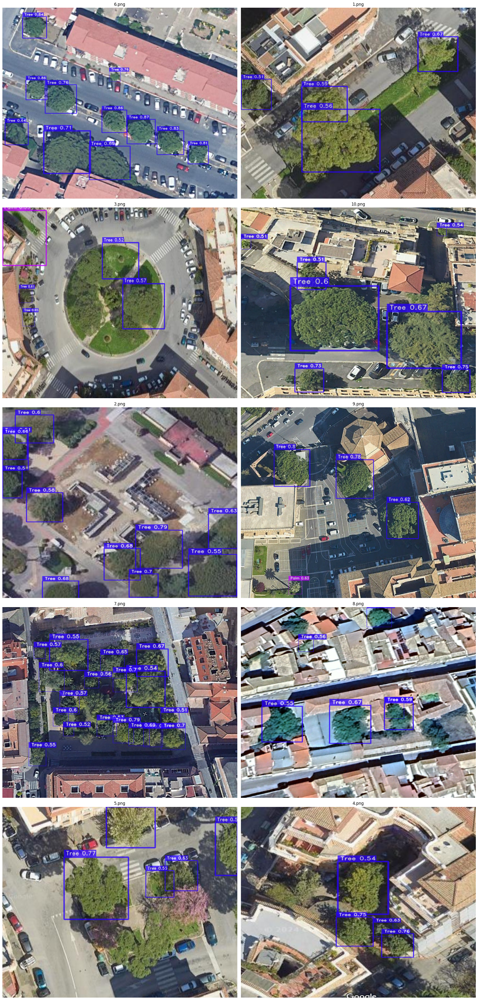

In [ ]:
import matplotlib.image as mpimg

def print_images(directory):
    files = os.listdir(directory)
    plt.figure(figsize=(20, 50))

    for i, file in enumerate(files):
        file_path = os.path.join(directory, file)

        img = mpimg.imread(file_path)

        plt.subplot(len(files)//2 + 1, 2, i+1)
        plt.imshow(img, aspect='auto')
        plt.axis('off')
        plt.title(file)

    plt.tight_layout()
    plt.show()


# Visualize a few test images.
directory = "inference_results/images"
print_images(directory)


### Video Object Detection
Using Google Earth pro, we created two videos that simulate some aerial footage, as if the videos where shot by some kind of drone or high resolution satellite.
We chose two very different location, namely **Ostia** and **Miami**, so to try to test our trained model on some disparate environments.

Despite some errors, also due to low resolution of input videos, we believe results are promising considering the still quite low number of training samples.

In [ ]:
# Video Prediction 1 - Ostia
dest_path1 = "/content/Green_Ostia_predicted.mp4"
input_video_path1 = '/content/drive/MyDrive/Project_Intelligent/Videos/Green_Ostia.mp4'

out1 = model_imp.predict(input_video_path1)
out1.save(dest_path1)

Processing Video: 100%|█████████▉| 1132/1133 [06:20<00:00,  4.52it/s]

In [ ]:
# Video Prediction 2 - Miami
dest_path2 = "/content/Green_Miami_predicted.mp4"
input_video_path2 = '/content/drive/MyDrive/Project_Intelligent/Videos/Green_Miami.mp4'

out1 = model_imp.predict(input_video_path2)
out1.save(dest_path2)

In [ ]:
#Load on Google Drive
import shutil

google_drive_path = "/content/drive/MyDrive/Project_Intelligent/Videos"

shutil.copy(dest_path1, google_drive_path)
shutil.copy(dest_path2, google_drive_path)

print("File copied to Google Drive")

## Auxiliary Functions

In [ ]:
# Delete folder contents
def delete_folder_contents(folder_path):
    files = os.listdir(folder_path)

    for file in files:
        file_path = os.path.join(folder_path, file)
        if os.path.isfile(file_path):
            os.remove(file_path)
        elif os.path.isdir(file_path):
            delete_folder_contents(file_path)
            os.rmdir(file_path)

#delete_folder_contents('/content/inference_results/images')